# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1]:
# Libraries for data loading, data manipulation and data visulisation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries for data preparation and model building
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_squared_log_error,r2_score

from sklearn.svm import SVR
from sklearn.ensemble import VotingRegressor, StackingRegressor

from sklearn.feature_selection import VarianceThreshold

# Setting global constants to ensure notebook results are reproducible
PARAMETER_CONSTANT = 42

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [2]:
df_train = pd.read_csv('df_train.csv') # load the data
df_test = pd.read_csv('df_test.csv') # load the data

In [3]:
df_train.head()

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


In [4]:
column_names = df_train.columns.to_list()
column_names

['Unnamed: 0',
 'time',
 'Madrid_wind_speed',
 'Valencia_wind_deg',
 'Bilbao_rain_1h',
 'Valencia_wind_speed',
 'Seville_humidity',
 'Madrid_humidity',
 'Bilbao_clouds_all',
 'Bilbao_wind_speed',
 'Seville_clouds_all',
 'Bilbao_wind_deg',
 'Barcelona_wind_speed',
 'Barcelona_wind_deg',
 'Madrid_clouds_all',
 'Seville_wind_speed',
 'Barcelona_rain_1h',
 'Seville_pressure',
 'Seville_rain_1h',
 'Bilbao_snow_3h',
 'Barcelona_pressure',
 'Seville_rain_3h',
 'Madrid_rain_1h',
 'Barcelona_rain_3h',
 'Valencia_snow_3h',
 'Madrid_weather_id',
 'Barcelona_weather_id',
 'Bilbao_pressure',
 'Seville_weather_id',
 'Valencia_pressure',
 'Seville_temp_max',
 'Madrid_pressure',
 'Valencia_temp_max',
 'Valencia_temp',
 'Bilbao_weather_id',
 'Seville_temp',
 'Valencia_humidity',
 'Valencia_temp_min',
 'Barcelona_temp_max',
 'Madrid_temp_max',
 'Barcelona_temp',
 'Bilbao_temp_min',
 'Bilbao_temp',
 'Barcelona_temp_min',
 'Bilbao_temp_max',
 'Seville_temp_min',
 'Madrid_temp',
 'Madrid_temp_min',
 'load_

In [5]:
column_var=df_train.describe().columns.to_list()

catergorical =set(column_names) -set(column_var)

In [6]:
catergorical

{'Seville_pressure', 'Valencia_wind_deg', 'time'}

In [7]:
df_train['Seville_pressure'].unique()

array(['sp25', 'sp23', 'sp24', 'sp21', 'sp16', 'sp9', 'sp15', 'sp19',
       'sp22', 'sp11', 'sp8', 'sp4', 'sp6', 'sp13', 'sp17', 'sp20',
       'sp18', 'sp14', 'sp12', 'sp5', 'sp10', 'sp7', 'sp3', 'sp2', 'sp1'],
      dtype=object)

In [8]:
df_train.shape

(8763, 49)

In [9]:
df_test.head(2)

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min
0,8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.0,71.333333,20.0,3.000000,...,287.816667,280.816667,287.356667,276.150000,280.38,286.816667,285.15,283.15,279.866667,279.15
1,8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.0,78.000000,0.0,3.666667,...,284.816667,280.483333,284.190000,277.816667,281.01,283.483333,284.15,281.15,279.193333,278.15


In [10]:
df_test.shape

(2920, 48)

In [11]:
#df_train.drop([''])

<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [17]:
# look at data statistics
df_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            8763 non-null   int64  
 1   time                  8763 non-null   object 
 2   Madrid_wind_speed     8763 non-null   float64
 3   Valencia_wind_deg     8763 non-null   object 
 4   Bilbao_rain_1h        8763 non-null   float64
 5   Valencia_wind_speed   8763 non-null   float64
 6   Seville_humidity      8763 non-null   float64
 7   Madrid_humidity       8763 non-null   float64
 8   Bilbao_clouds_all     8763 non-null   float64
 9   Bilbao_wind_speed     8763 non-null   float64
 10  Seville_clouds_all    8763 non-null   float64
 11  Bilbao_wind_deg       8763 non-null   float64
 12  Barcelona_wind_speed  8763 non-null   float64
 13  Barcelona_wind_deg    8763 non-null   float64
 14  Madrid_clouds_all     8763 non-null   float64
 15  Seville_wind_speed   

In [18]:
df_train.drop(['Unnamed: 0'], axis=1, inplace=True)
df_train.shape

(8763, 48)

In [19]:
print(df_train.isnull().sum())

time                       0
Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2068
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather_id          0
Seville_temp  

In [20]:
null_features_only=df_train.isnull().sum()[df_train.isnull().sum()>0]
null_features_only

Valencia_pressure    2068
dtype: int64

In [21]:
df_train['Valencia_pressure'].fillna(df_train['Valencia_pressure'].median(),inplace=True)
null_features_only=df_train.isnull().sum()[df_train.isnull().sum()>0]
null_features_only

Series([], dtype: int64)

In [22]:
df_train.describe()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,...,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,2.425729,0.135753,2.586272,62.658793,57.414717,43.469132,1.850356,13.714748,158.957511,2.870497,...,289.540309,289.855459,285.017973,286.422929,288.447422,287.966027,291.633356,288.419439,287.202203,10673.857612
std,1.850371,0.374901,2.411190,22.621226,24.335396,32.551044,1.695888,24.272482,102.056299,1.792197,...,9.752047,6.528111,6.705672,6.818682,6.102593,7.105590,8.178220,9.346796,9.206237,5218.046404
min,0.000000,0.000000,0.000000,8.333333,6.333333,0.000000,0.000000,0.000000,0.000000,0.000000,...,264.983333,270.816667,264.483333,267.483333,269.483333,269.063000,270.150000,264.983333,264.983333,-6618.000000
25%,1.000000,0.000000,1.000000,44.333333,36.333333,10.000000,0.666667,0.000000,73.333333,1.666667,...,282.150000,284.973443,280.085167,281.374167,284.150000,282.836776,285.816667,281.404281,280.299167,7390.333333
50%,2.000000,0.000000,1.666667,65.666667,58.000000,45.000000,1.000000,0.000000,147.000000,2.666667,...,288.116177,289.416667,284.816667,286.158333,288.150000,287.630000,290.816667,287.053333,286.083333,11114.666667
75%,3.333333,0.100000,3.666667,82.000000,78.666667,75.000000,2.666667,20.000000,234.000000,4.000000,...,296.816667,294.909000,289.816667,291.034167,292.966667,292.483333,297.150000,295.154667,293.884500,14498.166667
max,13.000000,3.000000,52.000000,100.000000,100.000000,100.000000,12.666667,97.333333,359.333333,12.666667,...,314.483333,307.316667,309.816667,310.710000,304.816667,317.966667,314.816667,313.133333,310.383333,31904.000000


In [23]:
# plot relevant feature interactions

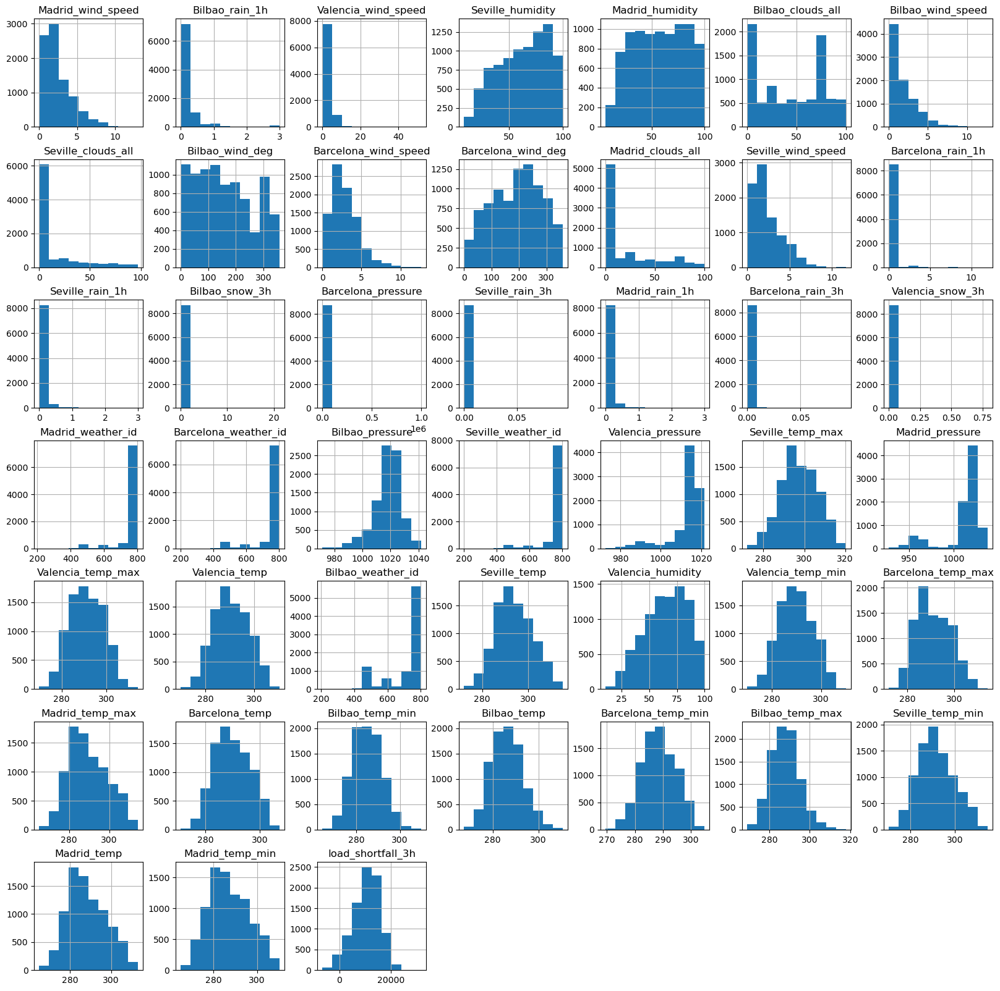

In [24]:
df_train.hist(figsize=(20,20));

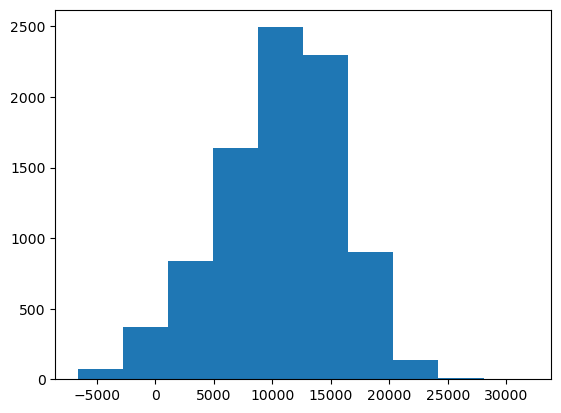

In [25]:
plt.hist(df_train['load_shortfall_3h'])
plt.show()

In [26]:
df_train['Barcelona_weather_id'].describe()

count    8763.000000
mean      765.979687
std        88.142235
min       200.666667
25%       800.000000
50%       800.333333
75%       801.000000
max       804.000000
Name: Barcelona_weather_id, dtype: float64

In [27]:
unique_count=df_train['Barcelona_weather_id'].nunique()
unique_count

269

In [28]:
constant_vars=df_train.columns[df_train.nunique()==1]
df_train_filter_constants=df_train.drop(columns=constant_vars)
df_train_filter_constants.shape

# noentirely unique variable - most variables lack variability

(8763, 48)

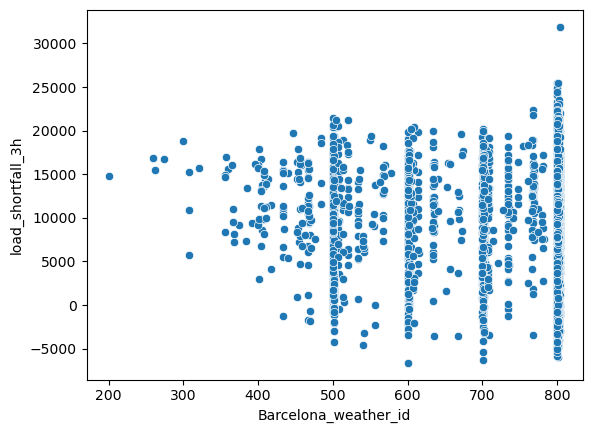

In [29]:
# Scatter plot
sns.scatterplot(x='Barcelona_weather_id', y='load_shortfall_3h', data=df_train)
plt.show()

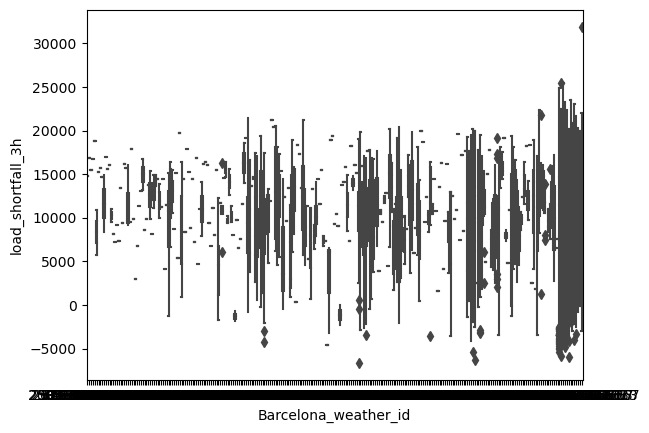

In [30]:
# Box plot
sns.boxplot(x='Barcelona_weather_id', y='load_shortfall_3h', data=df_train)
plt.show()

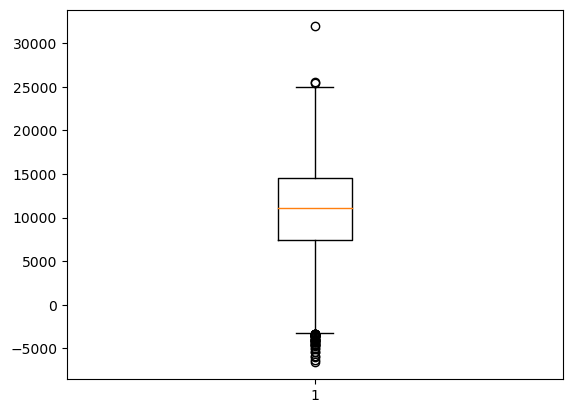

In [31]:
plt.boxplot(df_train['load_shortfall_3h'])
plt.show()

In [32]:
# evaluate correlation

In [33]:
correlation_matrix = df_train.corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm',vmin=-1,vmax=1)
plt.show()

ValueError: could not convert string to float: '2015-01-01 03:00:00'

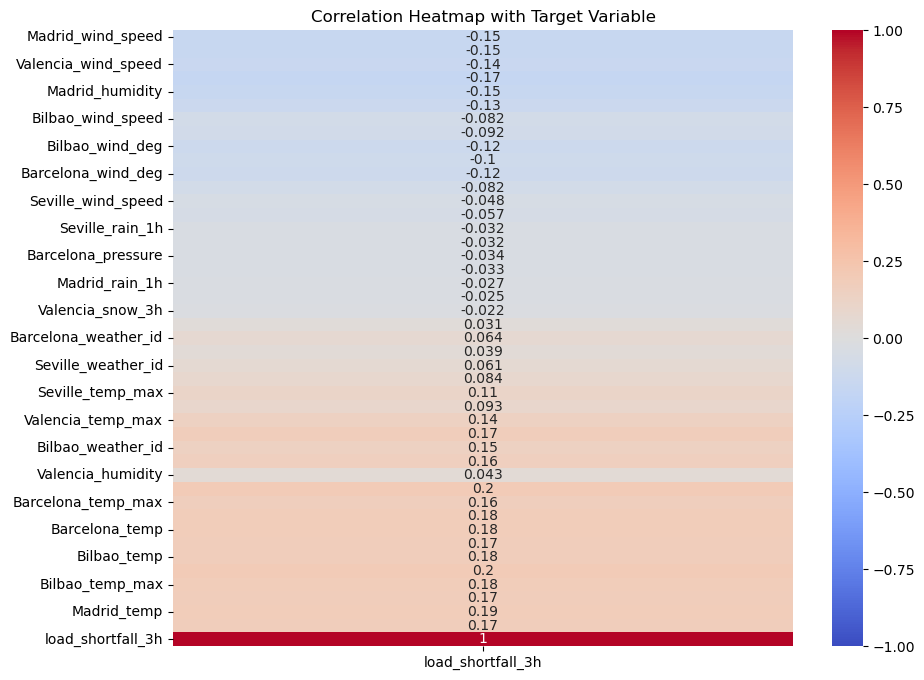

In [ ]:
correlation_matrix = df_train.corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix[['load_shortfall_3h']], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap with Target Variable')
plt.show()

/Users/nduqwele/miniconda3/envs/inference/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


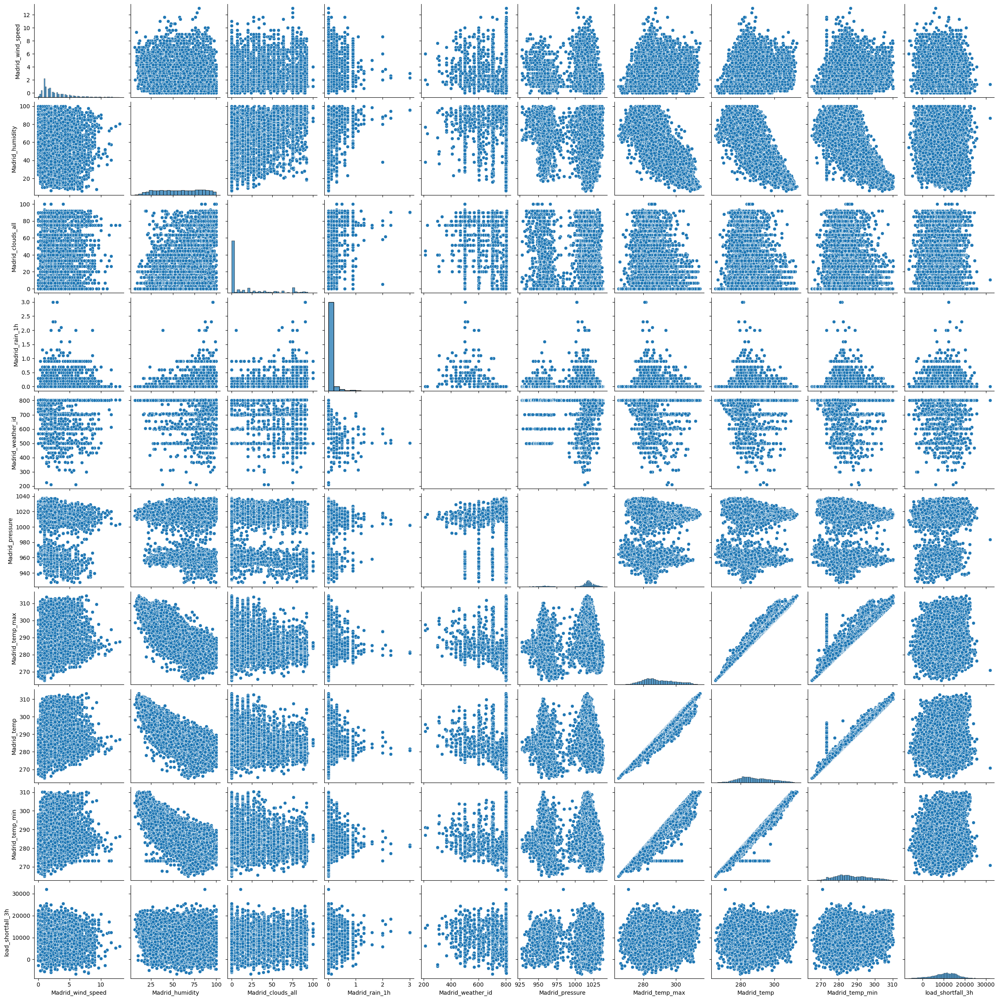

In [34]:
# have a look at feature distributions
madrid_features=df_train.filter(like='Madrid')
madrid=pd.concat([madrid_features,df_train['load_shortfall_3h']], axis=1)
sns.pairplot(madrid)
plt.show()

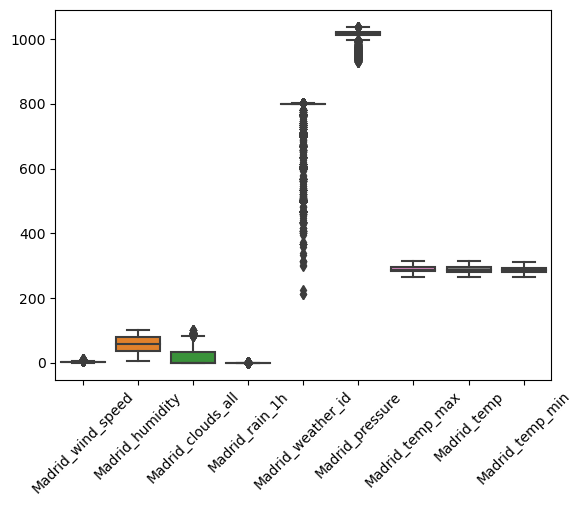

In [35]:
sns.boxplot(data=madrid_features)
plt.xticks(rotation=45)
plt.show()

/Users/nduqwele/miniconda3/envs/inference/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


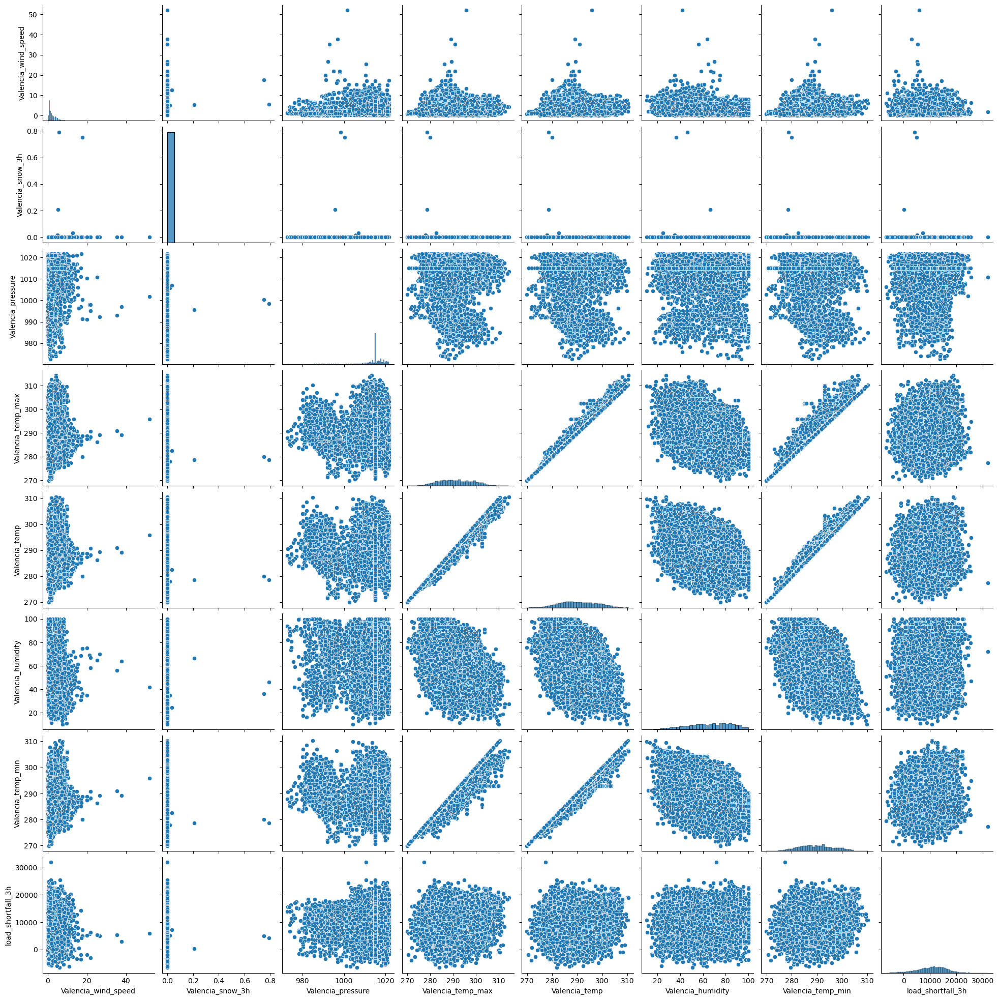

In [36]:
valencia_features=df_train.filter(like='Valencia')
valencia=pd.concat([valencia_features,df_train['load_shortfall_3h']], axis=1)
sns.pairplot(valencia)
plt.show()

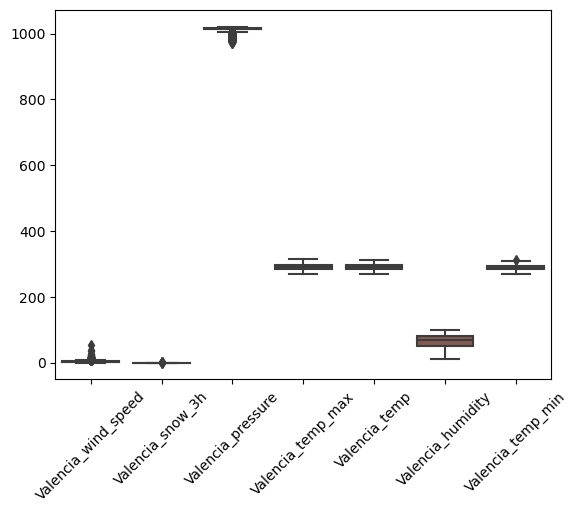

In [37]:
sns.boxplot(data=valencia_features)
plt.xticks(rotation=45)
plt.show()

/Users/nduqwele/miniconda3/envs/inference/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


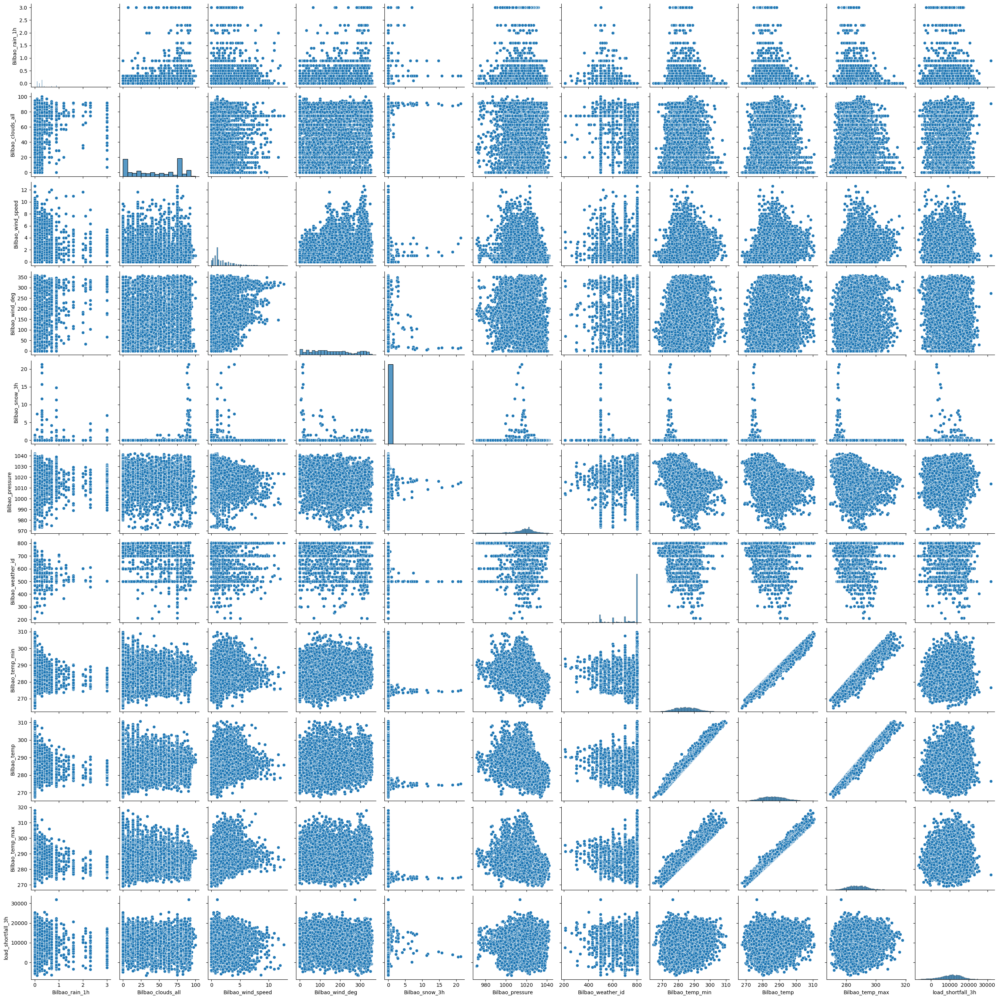

In [38]:
bilbao_features=df_train.filter(like='Bilbao')
bilbao=pd.concat([bilbao_features,df_train['load_shortfall_3h']], axis=1)
sns.pairplot(bilbao)
plt.show()

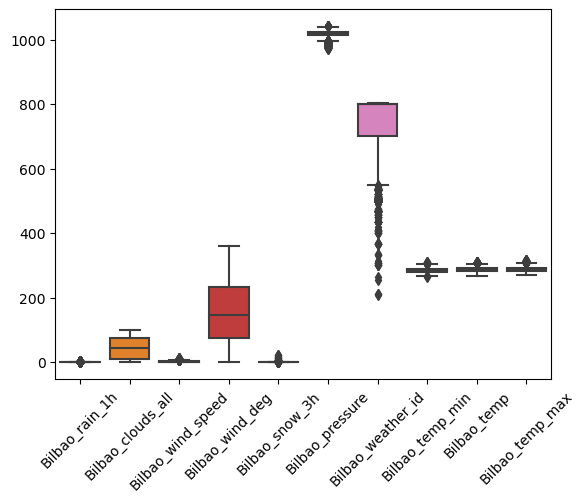

In [39]:
sns.boxplot(data=bilbao_features)
plt.xticks(rotation=45)
plt.show()

/Users/nduqwele/miniconda3/envs/inference/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


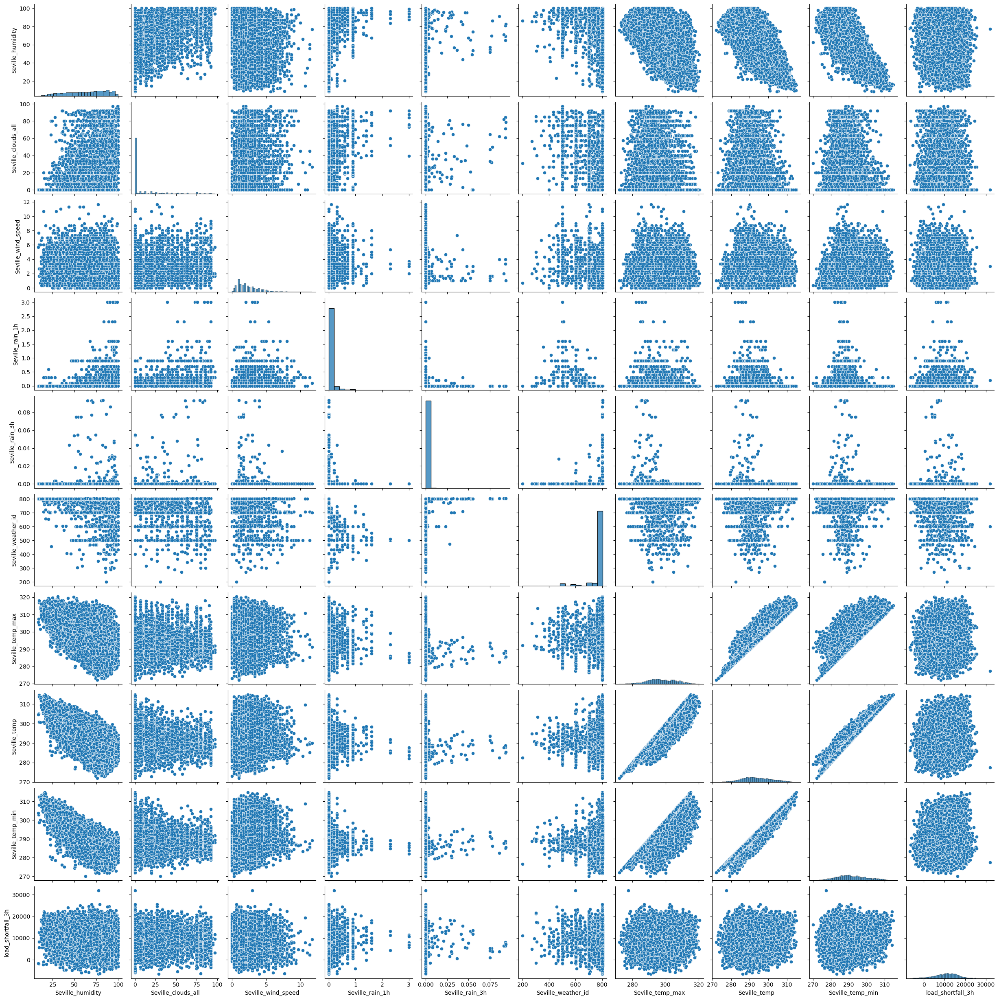

In [40]:
seville_features=df_train.filter(like='Seville')
seville=pd.concat([seville_features,df_train['load_shortfall_3h']], axis=1)
sns.pairplot(seville)
plt.show()

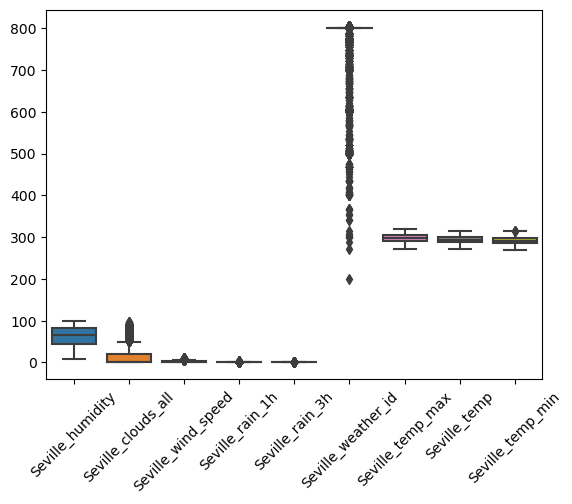

In [41]:
sns.boxplot(data=seville_features)
plt.xticks(rotation=45) 
plt.show()

In [42]:
barcelona_features=df_train.filter(like='Barcelona')
#barcelona=pd.concat([barcelona_features,df_train['load_shortfall_3h']], axis=1)
#sns.pairplot(barcelona)
#plt.show()
barcelona_features.head(5)

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min
0,6.333333,42.666667,0.0,1036.333333,0.0,800.0,281.013000,281.013000,281.013000
1,4.000000,139.000000,0.0,1037.333333,0.0,800.0,280.561667,280.561667,280.561667
2,2.000000,326.000000,0.0,1038.000000,0.0,800.0,281.583667,281.583667,281.583667
3,2.333333,273.000000,0.0,1037.000000,0.0,800.0,283.434104,283.434104,283.434104
4,4.333333,260.000000,0.0,1035.000000,0.0,800.0,284.213167,284.213167,284.213167


/Users/nduqwele/miniconda3/envs/inference/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


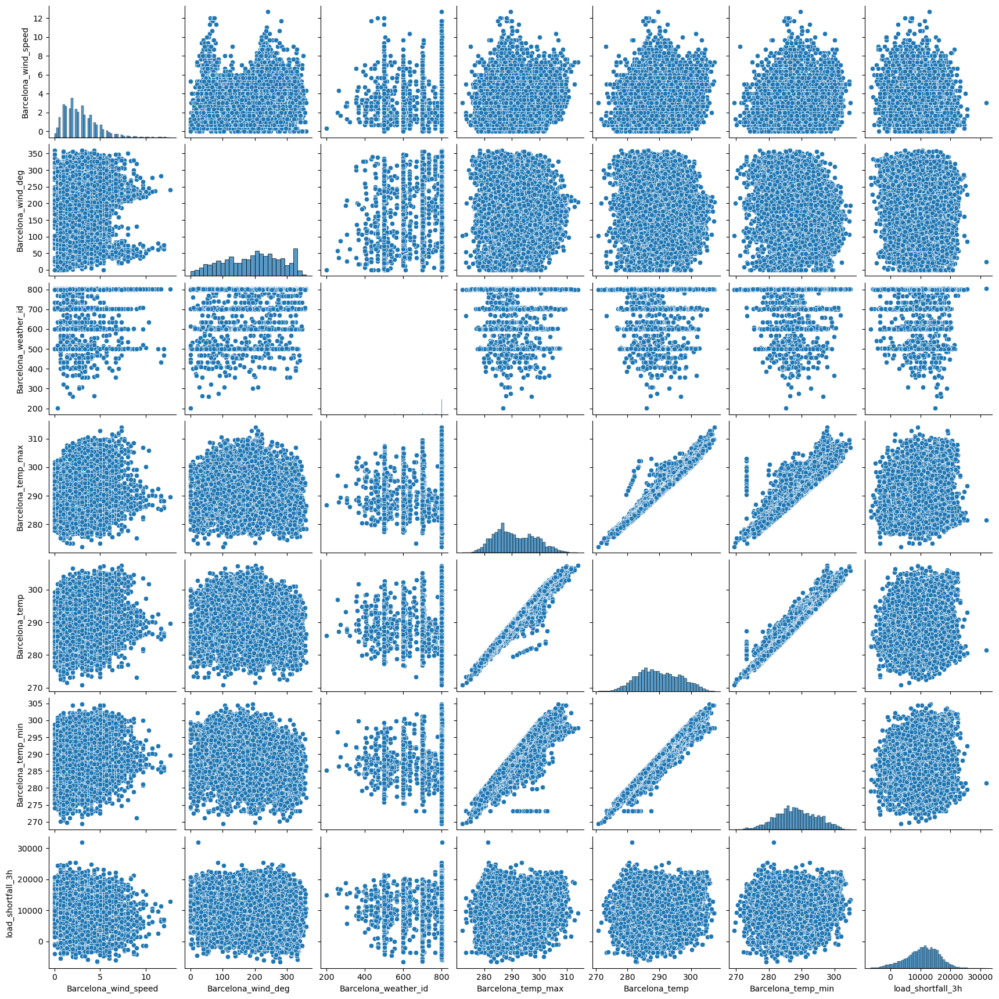

In [43]:
selected_features = ['Barcelona_wind_speed', 'Barcelona_wind_deg','Barcelona_weather_id','Barcelona_temp_max','Barcelona_temp','Barcelona_temp_min','load_shortfall_3h']

# Create a DataFrame with selected features
barcelona = df_train[selected_features]

# Plot pair plot
sns.pairplot(barcelona)
plt.show()

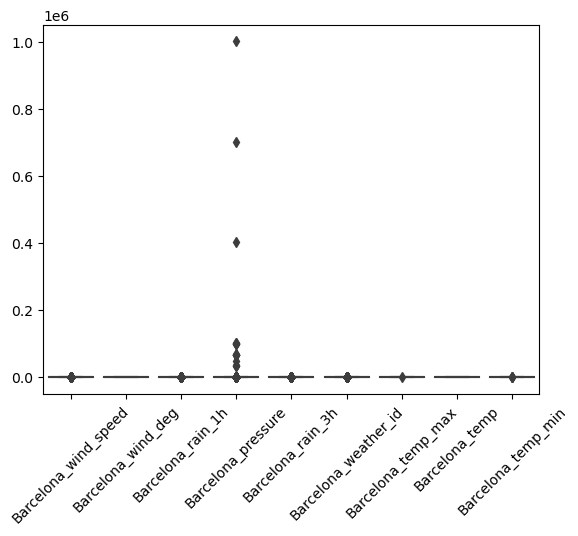

In [44]:
sns.boxplot(data=barcelona_features)
plt.xticks(rotation=45) 
plt.show()

In [45]:
df_train[['Barcelona_rain_1h','Barcelona_rain_3h','Barcelona_pressure']].describe()

,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_pressure
count,8763.000000,8763.000000,8.763000e+03
mean,0.128906,0.000439,1.377965e+03
std,0.634730,0.003994,1.407314e+04
min,0.000000,0.000000,6.706667e+02
25%,0.000000,0.000000,1.014000e+03
50%,0.000000,0.000000,1.018000e+03
75%,0.000000,0.000000,1.022000e+03
max,12.000000,0.093000,1.001411e+06


In [46]:
unique_count=df_train['Barcelona_rain_3h'].nunique()
unique_count

77

In [47]:
df_train['Barcelona_rain_1h'] = np.log1p(df_train['Barcelona_rain_1h'])
df_train['Barcelona_rain_3h'] = np.log1p(df_train['Barcelona_rain_3h'])
df_train['Barcelona_pressure'] = np.log1p(df_train['Barcelona_pressure'])

In [48]:
unique_count=df_train['Barcelona_rain_3h'].nunique()
unique_count

77

In [49]:
numeric_columns = df_train.select_dtypes(include=['float64', 'int64']).columns

df_train[numeric_columns] = df_train[numeric_columns].apply(pd.to_numeric, errors='coerce')

for column in numeric_columns:
    Q1 = df_train[column].quantile(0.25)
    Q3 = df_train[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = (df_train[column] < lower_bound) | (df_train[column] > upper_bound)
    df_train = df_train[~outliers]


In [50]:
df_train.shape


(1607, 48)

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [51]:
df_train.head(2)

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
391,2015-02-19 12:00:00,1.333333,level_1,0.0,4.0,71.000000,42.000000,0.000000,1.0,0.0,...,286.550000,286.460000,280.657771,280.657771,286.460000,280.657771,288.792667,286.260000,286.116667,13181.666667
471,2015-03-01 12:00:00,3.333333,level_8,0.0,2.0,66.333333,66.666667,90.666667,1.0,0.0,...,287.503333,286.990833,285.375563,285.375563,286.990833,285.375563,290.104719,287.503333,287.503333,12202.666667


In [52]:
# remove missing values/ features

In [53]:
# create new features
df_train['Time']=pd.to_datetime(df_train['time']) #change from object to date

df_train['Month']=df_train['Time'].dt.month
df_train['Hour']=df_train['Time'].dt.hour
df_train.head()

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,Time,Month,Hour
391,2015-02-19 12:00:00,1.333333,level_1,0.0,4.000000,71.000000,42.000000,0.000000,1.000000,0.0,...,280.657771,286.460000,280.657771,288.792667,286.260000,286.116667,13181.666667,2015-02-19 12:00:00,2,12
471,2015-03-01 12:00:00,3.333333,level_8,0.0,2.000000,66.333333,66.666667,90.666667,1.000000,0.0,...,285.375563,286.990833,285.375563,290.104719,287.503333,287.503333,12202.666667,2015-03-01 12:00:00,3,12
508,2015-03-06 03:00:00,2.333333,level_7,0.0,1.333333,30.000000,39.000000,0.000000,0.666667,0.0,...,273.228781,278.286667,273.228781,283.748333,276.715000,274.525000,11179.000000,2015-03-06 03:00:00,3,3
509,2015-03-06 06:00:00,1.666667,level_6,0.0,1.333333,37.000000,62.666667,0.000000,0.000000,0.0,...,274.469125,276.300000,274.469125,280.816667,275.790000,272.410000,10557.000000,2015-03-06 06:00:00,3,6
512,2015-03-06 15:00:00,2.000000,level_5,0.0,3.666667,26.666667,25.666667,0.000000,0.000000,0.0,...,285.421562,285.557000,285.421562,293.036885,289.525333,288.815333,13856.666667,2015-03-06 15:00:00,3,15


In [54]:
def month_to_season(Month):
    if 3<=Month<=5:
        return 'Spring'
    elif 6<=Month<=8:
        return 'Summer'
    elif 9<=Month<=11:
        return 'Fall'
    else:
        return 'Winter'
      

In [55]:
 
def hour_to_timeday(Hour):
    if 6<=Hour<12:
        return 'Morning'
    elif 12<=Hour<18:
        return 'Aftenoon'
    else:
        return 'Night'

In [56]:
df_train['Season']=df_train['Month'].apply(month_to_season)

In [57]:
df_train['PartOfDay']=df_train['Hour'].apply(hour_to_timeday)

In [58]:
df_train.head()

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,Time,Month,Hour,Season,PartOfDay
391,2015-02-19 12:00:00,1.333333,level_1,0.0,4.000000,71.000000,42.000000,0.000000,1.000000,0.0,...,280.657771,288.792667,286.260000,286.116667,13181.666667,2015-02-19 12:00:00,2,12,Winter,Aftenoon
471,2015-03-01 12:00:00,3.333333,level_8,0.0,2.000000,66.333333,66.666667,90.666667,1.000000,0.0,...,285.375563,290.104719,287.503333,287.503333,12202.666667,2015-03-01 12:00:00,3,12,Spring,Aftenoon
508,2015-03-06 03:00:00,2.333333,level_7,0.0,1.333333,30.000000,39.000000,0.000000,0.666667,0.0,...,273.228781,283.748333,276.715000,274.525000,11179.000000,2015-03-06 03:00:00,3,3,Spring,Night
509,2015-03-06 06:00:00,1.666667,level_6,0.0,1.333333,37.000000,62.666667,0.000000,0.000000,0.0,...,274.469125,280.816667,275.790000,272.410000,10557.000000,2015-03-06 06:00:00,3,6,Spring,Morning
512,2015-03-06 15:00:00,2.000000,level_5,0.0,3.666667,26.666667,25.666667,0.000000,0.000000,0.0,...,285.421562,293.036885,289.525333,288.815333,13856.666667,2015-03-06 15:00:00,3,15,Spring,Aftenoon


In [59]:
df_train.drop(['time','Time','Month','Hour'], axis=1, inplace=True)
df_train.shape

(1607, 49)

In [60]:
df_train.drop(['Month','Hour'], axis=1, inplace=True)
df_train.shape

KeyError: "['Month', 'Hour'] not found in axis"

In [ ]:
df_train.head()

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,...,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,Season,PartOfDay
391,1.333333,level_1,0.0,4.000000,71.000000,42.000000,0.000000,1.000000,0.0,184.333333,...,280.657771,280.657771,286.460000,280.657771,288.792667,286.260000,286.116667,13181.666667,Winter,Aftenoon
471,3.333333,level_8,0.0,2.000000,66.333333,66.666667,90.666667,1.000000,0.0,181.666667,...,285.375563,285.375563,286.990833,285.375563,290.104719,287.503333,287.503333,12202.666667,Spring,Aftenoon
508,2.333333,level_7,0.0,1.333333,30.000000,39.000000,0.000000,0.666667,0.0,78.333333,...,273.228781,273.228781,278.286667,273.228781,283.748333,276.715000,274.525000,11179.000000,Spring,Night
509,1.666667,level_6,0.0,1.333333,37.000000,62.666667,0.000000,0.000000,0.0,70.000000,...,274.469125,274.469125,276.300000,274.469125,280.816667,275.790000,272.410000,10557.000000,Spring,Morning
512,2.000000,level_5,0.0,3.666667,26.666667,25.666667,0.000000,0.000000,0.0,104.000000,...,285.421562,285.421562,285.557000,285.421562,293.036885,289.525333,288.815333,13856.666667,Spring,Aftenoon


In [110]:
string_object_features=df_train.select_dtypes(include='object')
string_object_features.head(2)

,Valencia_wind_deg,Seville_pressure,Season,PartOfDay
391,level_1,sp25,Winter,Aftenoon
471,level_8,sp22,Spring,Aftenoon


In [109]:
# engineer existing features


In [111]:

categorical_columns = ['Valencia_wind_deg', 'Seville_pressure', 'Season', 'PartOfDay']

df_train_dummies = pd.get_dummies(df_train[categorical_columns])

# Concatenate the dummy variables with the original DataFrame
df_train = pd.concat([df_train, df_train_dummies], axis=1)

# Drop the original categorical columns if needed
df_train = df_train.drop(categorical_columns, axis=1)
df_train.head(2)

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Seville_pressure_sp7,Seville_pressure_sp8,Seville_pressure_sp9,Season_Fall,Season_Spring,Season_Summer,Season_Winter,PartOfDay_Aftenoon,PartOfDay_Morning,PartOfDay_Night
391,1.333333,0.0,4.0,71.000000,42.000000,0.000000,1.0,0.0,184.333333,2.000000,...,0,0,0,0,0,0,1,1,0,0
471,3.333333,0.0,2.0,66.333333,66.666667,90.666667,1.0,0.0,181.666667,1.666667,...,0,0,0,0,1,0,0,1,0,0


In [143]:
corr=df_train.corr()
#r,c=np.where(np.abs(corr)>0.9)
#off_diagonal=np.where (r!=c)
#corr.iloc[r[off_diagonal],c[off_diagonal]]

mask=np.abs(corr)>0.9
r,c =np.where(mask)
off_diagonal = np.where(r != c)

variables_to_drop=set()
for i,j in zip(r[off_diagonal],c[off_diagonal]):
    variable_i = corr.columns[i]
    variable_j = corr.columns[j]
    
    variable_to_drop = variable_i if i<j else variable_j
    
    variables_to_drop.add(variable_to_drop)
                
df_train_filtered2=df_train.drop(columns=variables_to_drop)
print(df_train_filtered2)

      Madrid_wind_speed  Bilbao_rain_1h  Valencia_wind_speed  \
391            1.333333             0.0             4.000000   
471            3.333333             0.0             2.000000   
508            2.333333             0.0             1.333333   
509            1.666667             0.0             1.333333   
512            2.000000             0.0             3.666667   
...                 ...             ...                  ...   
8704           1.000000             0.0             2.333333   
8705           1.000000             0.0             1.666667   
8706           1.333333             0.0             0.666667   
8753           2.000000             0.0             5.000000   
8754           1.333333             0.0             3.666667   

      Seville_humidity  Madrid_humidity  Bilbao_wind_speed  \
391          71.000000        42.000000           1.000000   
471          66.333333        66.666667           1.000000   
508          30.000000        39.000000      

In [144]:
df_train_filtered2

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,Barcelona_wind_deg,...,Seville_pressure_sp7,Seville_pressure_sp8,Seville_pressure_sp9,Season_Fall,Season_Spring,Season_Summer,Season_Winter,PartOfDay_Aftenoon,PartOfDay_Morning,PartOfDay_Night
391,1.333333,0.0,4.000000,71.000000,42.000000,1.000000,0.0,184.333333,2.000000,22.000000,...,0,0,0,0,0,0,1,1,0,0
471,3.333333,0.0,2.000000,66.333333,66.666667,1.000000,0.0,181.666667,1.666667,247.333333,...,0,0,0,0,1,0,0,1,0,0
508,2.333333,0.0,1.333333,30.000000,39.000000,0.666667,0.0,78.333333,5.000000,320.000000,...,0,0,0,0,1,0,0,0,0,1
509,1.666667,0.0,1.333333,37.000000,62.666667,0.000000,0.0,70.000000,5.000000,326.666667,...,0,0,0,0,1,0,0,0,1,0
512,2.000000,0.0,3.666667,26.666667,25.666667,0.000000,0.0,104.000000,4.000000,191.000000,...,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8704,1.000000,0.0,2.333333,51.666667,64.666667,1.333333,0.0,96.666667,2.666667,260.000000,...,0,0,0,0,0,0,1,1,0,0
8705,1.000000,0.0,1.666667,61.666667,76.666667,0.666667,0.0,224.666667,0.666667,186.666667,...,0,0,0,0,0,0,1,0,0,1
8706,1.333333,0.0,0.666667,83.333333,97.666667,0.666667,0.0,139.000000,3.333333,170.666667,...,0,0,0,0,0,0,1,0,0,1
8753,2.000000,0.0,5.000000,68.666667,78.000000,3.000000,0.0,166.666667,1.666667,313.000000,...,0,0,0,0,0,0,1,0,0,1


In [145]:
variables_to_drop

{'Barcelona_temp',
 'Barcelona_temp_max',
 'Bilbao_clouds_all',
 'Bilbao_temp',
 'Bilbao_temp_min',
 'Madrid_temp',
 'Madrid_temp_max',
 'Seville_temp',
 'Seville_temp_max',
 'Seville_temp_min',
 'Valencia_temp',
 'Valencia_temp_max',
 'Valencia_temp_min'}

In [151]:
selected_features

Index(['Madrid_wind_speed', 'Valencia_wind_speed', 'Seville_humidity',
       'Madrid_humidity', 'Bilbao_clouds_all', 'Bilbao_wind_speed',
       'Bilbao_wind_deg', 'Barcelona_wind_speed', 'Barcelona_wind_deg',
       'Madrid_clouds_all', 'Seville_wind_speed', 'Barcelona_weather_id',
       'Bilbao_pressure', 'Valencia_pressure', 'Seville_temp_max',
       'Madrid_pressure', 'Valencia_temp_max', 'Valencia_temp',
       'Bilbao_weather_id', 'Seville_temp', 'Valencia_humidity',
       'Valencia_temp_min', 'Barcelona_temp_max', 'Madrid_temp_max',
       'Barcelona_temp', 'Bilbao_temp_min', 'Bilbao_temp',
       'Barcelona_temp_min', 'Bilbao_temp_max', 'Seville_temp_min',
       'Madrid_temp', 'Madrid_temp_min', 'Valencia_wind_deg_level_1',
       'Valencia_wind_deg_level_2', 'Valencia_wind_deg_level_3',
       'Valencia_wind_deg_level_4', 'Valencia_wind_deg_level_5', 'Season_Fall',
       'Season_Spring', 'Season_Summer', 'PartOfDay_Aftenoon',
       'PartOfDay_Morning', 'PartOfDay_Night'

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [112]:
# split data
X=df_train.drop(columns=['load_shortfall_3h'])
y=df_train['load_shortfall_3h']

X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state= PARAMETER_CONSTANT)

In [113]:
X_train.head(2)

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Seville_pressure_sp7,Seville_pressure_sp8,Seville_pressure_sp9,Season_Fall,Season_Spring,Season_Summer,Season_Winter,PartOfDay_Aftenoon,PartOfDay_Morning,PartOfDay_Night
1767,1.0,0.0,2.333333,34.0,26.666667,0.000000,4.0,0.0,113.333333,3.000000,...,0,0,0,0,0,1,0,1,0,0
7307,2.0,0.0,1.000000,28.0,28.000000,49.333333,0.0,0.0,83.333333,0.333333,...,0,0,0,0,0,1,0,0,0,1


In [114]:
X_train.shape

(1124, 86)

In [115]:
X_test.shape

(483, 86)

In [152]:


# Assuming X_train is your feature matrix
# Set an appropriate threshold value (you can experiment with different values)
threshold = 0.1

# Initialize VarianceThreshold
variance_selector = VarianceThreshold(threshold=threshold)

# Fit and transform your feature matrix
X_train_filtered = variance_selector.fit_transform(X_train)

# Get the mask of selected features
feature_mask = variance_selector.get_support()

# Get the selected feature names
selected_features = X_train.columns[feature_mask]

# Display the selected features
print("Selected Features:")
print(selected_features)

# Display the transformed feature matrix
print("Transformed Feature Matrix:")
print(X_train_filtered)

Selected Features:
Index(['Madrid_wind_speed', 'Valencia_wind_speed', 'Seville_humidity',
       'Madrid_humidity', 'Bilbao_clouds_all', 'Bilbao_wind_speed',
       'Bilbao_wind_deg', 'Barcelona_wind_speed', 'Barcelona_wind_deg',
       'Madrid_clouds_all', 'Seville_wind_speed', 'Barcelona_weather_id',
       'Bilbao_pressure', 'Valencia_pressure', 'Seville_temp_max',
       'Madrid_pressure', 'Valencia_temp_max', 'Valencia_temp',
       'Bilbao_weather_id', 'Seville_temp', 'Valencia_humidity',
       'Valencia_temp_min', 'Barcelona_temp_max', 'Madrid_temp_max',
       'Barcelona_temp', 'Bilbao_temp_min', 'Bilbao_temp',
       'Barcelona_temp_min', 'Bilbao_temp_max', 'Seville_temp_min',
       'Madrid_temp', 'Madrid_temp_min', 'Valencia_wind_deg_level_1',
       'Valencia_wind_deg_level_2', 'Valencia_wind_deg_level_3',
       'Valencia_wind_deg_level_4', 'Valencia_wind_deg_level_5', 'Season_Fall',
       'Season_Spring', 'Season_Summer', 'PartOfDay_Aftenoon',
       'PartOfDay_Morning'

In [ ]:
# create targets and features dataset

In [153]:
# create one or more ML models
# Initialize models
linear_reg = LinearRegression()
ridge_reg = Ridge()
lasso_reg = Lasso()
tree_reg = DecisionTreeRegressor()
forest_reg = RandomForestRegressor()
svr_reg = SVR(kernel='rbf',gamma='auto')
#v_reg = VotingRegressor(estimators=models, weights=model_weightings)
#stack_reg = StackingRegressor(estimators=models,final_estimator=meta_reg)
#bag_reg = BaggingRegressor()
#bst_reg = AdaBoostRegressor()

# Train models
linear_reg.fit(X_train, y_train)
ridge_reg.fit(X_train, y_train)
lasso_reg.fit(X_train, y_train)
tree_reg.fit(X_train, y_train)
forest_reg.fit(X_train, y_train)
svr_reg.fit(X_train, y_train)
#v_reg.fit(X_train, y_train)
#stack_reg.fit(X_train, y_train)
#bag_reg.fit(X_train, y_train)
#bst_reg.fit(X_train, y_train)

# Make predictions
linear_pred = linear_reg.predict(X_test)
ridge_pred = ridge_reg.predict(X_test)
lasso_pred = lasso_reg.predict(X_test)
tree_pred = tree_reg.predict(X_test)
forest_pred = forest_reg.predict(X_test)
svr_pred = svr_reg.predict(X_test)
#v_pred = v_reg.predict(X_test)
#stack_pred = stack_reg.predict(X_test)
#bag_pred = bag_reg.predict(X_test)
#bst_pred = bst_reg.predict(X_test)

# Evaluate models
def evaluate_model(predictions, actual):
    mse = mean_squared_error(actual, predictions)
    rmse = np.sqrt(mse)
    r2=r2_score(actual,predictions)
    return rmse,r2

print("Linear Regression RMSE and R2:", evaluate_model(linear_pred, y_test))
print("Ridge Regression RMSE and R2:", evaluate_model(ridge_pred, y_test))
print("Lasso Regression RMSE and R2:", evaluate_model(lasso_pred, y_test))
print("Decision Tree RMSE and R2:", evaluate_model(tree_pred, y_test))
print("Random Forest RMSE and R2:", evaluate_model(forest_pred, y_test))
print("SVR RMSE:", evaluate_model(svr_pred, y_test))
#print("Voter RMSE:", evaluate_model(v_pred, y_test))
#print("Stack RMSE:", evaluate_model(stack_pred, y_test))
#print("Bagging RMSE:", evaluate_model(bag_pred, y_test))
#print("Boosting RMSE:", evaluate_model(bst_pred, y_test))



/Users/phila/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.222e+09, tolerance: 2.198e+06
  model = cd_fast.enet_coordinate_descent(


Linear Regression RMSE and R2: (4368.109742425714, 0.14197447513750439)
Ridge Regression RMSE and R2: (4352.121387946517, 0.14824414813785647)
Lasso Regression RMSE and R2: (4351.902026821345, 0.1483300085248518)
Decision Tree RMSE and R2: (5634.640464904315, -0.42772822585079395)
Random Forest RMSE and R2: (4090.4210028274774, 0.24759937917490504)
SVR RMSE: (4750.942110055082, -0.01501533360616003)


In [154]:
lasso_coefficients = lasso_reg.coef_

# Get the names of the features
feature_names = X_train.columns

# Create a DataFrame to display the coefficients and their corresponding feature names
coefficients_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': lasso_coefficients})

# Filter non-zero coefficients (selected features)
selected_features = coefficients_df[coefficients_df['Coefficient'] != 0]
deselected_features = coefficients_df[coefficients_df['Coefficient'] == 0]
# Display selected features
print(selected_features)

                Feature  Coefficient
0     Madrid_wind_speed  -327.481105
2   Valencia_wind_speed  -228.980152
3      Seville_humidity   -42.387620
4       Madrid_humidity     1.095344
5     Bilbao_clouds_all    44.648603
..                  ...          ...
80        Season_Spring -2141.920289
81        Season_Summer  1312.689897
82        Season_Winter -1796.629880
83   PartOfDay_Aftenoon  1727.983691
84    PartOfDay_Morning -2008.548970

[71 rows x 2 columns]


In [132]:
selected_features.shape

(71, 2)

In [133]:
deselected_features.shape

(15, 2)

In [155]:
print(deselected_features)

                      Feature  Coefficient
1              Bilbao_rain_1h          0.0
13          Barcelona_rain_1h          0.0
14            Seville_rain_1h          0.0
15             Bilbao_snow_3h          0.0
16         Barcelona_pressure         -0.0
17            Seville_rain_3h          0.0
18             Madrid_rain_1h          0.0
19          Barcelona_rain_3h          0.0
20           Valencia_snow_3h          0.0
21          Madrid_weather_id          0.0
24         Seville_weather_id          0.0
51  Valencia_wind_deg_level_7         -0.0
59      Seville_pressure_sp14         -0.0
77       Seville_pressure_sp8         -0.0
85            PartOfDay_Night         -0.0


In [120]:
# evaluate one or more ML modelsa

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [ ]:
# Compare model performance

In [ ]:
# Choose best model and motivate why it is the best choice

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic